In [1]:
!pip install torchcam

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 2.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 10.8 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 83.2 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.8.93
    Uninstalling nvidia-nvjitlink-cu12-12.8.93:
      Successfully uninstalled nvidia-nvjitlink-cu12-12.8.93
  Attempting uninstall: nvidia-curand-cu12
    Found existing in

In [4]:
import os
import shutil
import random
from sklearn.model_selection import train_test_split
from glob import glob
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.models as models
from torchvision import transforms, datasets
from torch.utils.data import DataLoader
from PIL import Image, ImageEnhance, ImageOps
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchcam.methods import SmoothGradCAMpp
import shap
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay


In [7]:
# Paths and Settings
RAW_DIR = "/kaggle/input/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone/CT-KIDNEY-DATASET-Normal-Cyst-Tumor-Stone"
OUTPUT_DIR = "processed_kidney_dataset"
BALANCED_DIR = "balanced_kidney_dataset"
CLASSES = ["Cyst", "Normal", "Stone", "Tumor"]
IMG_SIZE = (128, 128)
IMG_EXTENSIONS = (".jpg", ".jpeg", ".png")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [12]:
# Create directories
def make_dir(path):
    os.makedirs(path, exist_ok=True)

# Split dataset into train, val, test
def split_dataset(seed=42):
    random.seed(seed)
    for cls in CLASSES:
        cls_path = os.path.join(RAW_DIR, cls)
        images = [os.path.join(cls_path, f) for f in os.listdir(cls_path) if f.endswith(IMG_EXTENSIONS)]
        
        train_imgs, temp_imgs = train_test_split(images, test_size=0.3, random_state=seed)
        val_imgs, test_imgs = train_test_split(temp_imgs, test_size=0.5, random_state=seed)

        for split, split_imgs in zip(["train", "val", "test"], [train_imgs, val_imgs, test_imgs]):
            split_dir = os.path.join(OUTPUT_DIR, split, cls)
            make_dir(split_dir)
            for img in split_imgs:
                shutil.copy(img, os.path.join(split_dir, os.path.basename(img)))

# Print the number of images in each split
def print_split_summary(base_dir):
    print(f"\n📊 Dataset Summary in '{base_dir}':\n")
    for split in ["train", "val", "test"]:
        split_dir = os.path.join(base_dir, split)
        print(f"🔹 Split: {split}")
        class_dirs = [d for d in os.listdir(split_dir) if os.path.isdir(os.path.join(split_dir, d))]
        for cls in sorted(class_dirs):
            img_count = len(glob(os.path.join(split_dir, cls, '*')))
            print(f"    - {cls}: {img_count} images")
        print()

split_dataset()
print_split_summary(OUTPUT_DIR)



📊 Dataset Summary in 'processed_kidney_dataset':

🔹 Split: train
    - Cyst: 2596 images
    - Normal: 3553 images
    - Stone: 963 images
    - Tumor: 1598 images

🔹 Split: val
    - Cyst: 556 images
    - Normal: 762 images
    - Stone: 207 images
    - Tumor: 342 images

🔹 Split: test
    - Cyst: 557 images
    - Normal: 762 images
    - Stone: 207 images
    - Tumor: 343 images



In [14]:
# Define the GAN Generator (for synthetic image generation)
def build_generator():
    model = torch.nn.Sequential(
        torch.nn.Linear(100, 128),
        torch.nn.ReLU(),
        torch.nn.Linear(128, 256),
        torch.nn.ReLU(),
        torch.nn.Linear(256, 128 * 128),
        torch.nn.Tanh(),
        torch.nn.Unflatten(1, (1, 128, 128)),  # Reshapes it to image-like dimensions
    )
    return model

# Augmentation functions
def augment_image(img):
    augmented_images = []
    augmented_images.append(ImageOps.mirror(img))  # Horizontal flip
    augmented_images.append(img.rotate(15))        # Rotation 15 degrees
    augmented_images.append(img.rotate(-15))       # Rotation -15 degrees
    enhancer = ImageEnhance.Contrast(img)          # Contrast enhancement
    augmented_images.append(enhancer.enhance(1.5))
    return augmented_images

# GAN-based image generation
def generate_gan_images(generator, num_images):
    noise = torch.randn(num_images, 100)
    generated_images = generator(noise)
    return [Image.fromarray((img.squeeze().detach().numpy() * 127.5 + 127.5).astype(np.uint8)) for img in generated_images]

# Balance dataset by traditional and GAN-based augmentation
def balance_dataset():
    make_dir(f"{BALANCED_DIR}/train")
    make_dir(f"{BALANCED_DIR}/val")
    make_dir(f"{BALANCED_DIR}/test")

    max_count = 0
    class_counts = {}

    for cls in CLASSES:
        src = os.path.join(OUTPUT_DIR, "train", cls)
        images = glob(os.path.join(src, "*"))
        class_counts[cls] = len(images)
        max_count = max(max_count, len(images))

    generator = build_generator()  # Initialize the generator

    # Handle training dataset
    for cls in CLASSES:
        cls_src = os.path.join(OUTPUT_DIR, "train", cls)
        cls_dst = os.path.join(BALANCED_DIR, "train", cls)
        make_dir(cls_dst)

        images = glob(os.path.join(cls_src, "*"))
        count = len(images)

        for img_path in images:
            shutil.copy(img_path, os.path.join(cls_dst, os.path.basename(img_path)))

        num_needed = max_count - count
        if num_needed <= 0:
            print(f"✅ Already balanced.\n")
            continue

        base_images = [Image.open(img).convert("L").resize(IMG_SIZE) for img in images]
        aug_imgs = []
        for img in base_images:
            aug_imgs.extend(augment_image(img))  # Apply traditional augmentation
            if len(aug_imgs) >= num_needed:
                break

        aug_imgs = aug_imgs[:num_needed // 2]  # Limit augmentation
        gan_imgs = generate_gan_images(generator, num_needed - len(aug_imgs))  # Generate synthetic images

        for idx, img in enumerate(aug_imgs):
            img.save(os.path.join(cls_dst, f"{cls}_aug_{idx}.png"))

        for idx, img in enumerate(gan_imgs):
            img.save(os.path.join(cls_dst, f"{cls}_gan_{idx}.png"))

    # Handle validation and test datasets (no GAN, only resizing)
    for split in ["val", "test"]:
        for cls in CLASSES:
            cls_src = os.path.join(OUTPUT_DIR, split, cls)
            cls_dst = os.path.join(BALANCED_DIR, split, cls)
            make_dir(cls_dst)

            images = glob(os.path.join(cls_src, "*"))
            for img_path in images:
                img = Image.open(img_path).convert("L").resize(IMG_SIZE)
                img.save(os.path.join(cls_dst, os.path.basename(img_path)))

    print_split_summary(BALANCED_DIR)

balance_dataset()


✅ Already balanced.


📊 Dataset Summary in 'balanced_kidney_dataset':

🔹 Split: train
    - Cyst: 3553 images
    - Normal: 3553 images
    - Stone: 3553 images
    - Tumor: 3553 images

🔹 Split: val
    - Cyst: 556 images
    - Normal: 762 images
    - Stone: 207 images
    - Tumor: 342 images

🔹 Split: test
    - Cyst: 557 images
    - Normal: 762 images
    - Stone: 207 images
    - Tumor: 343 images



In [18]:
# Define ResNet18 Model
def get_resnet():
    model = models.resnet18(pretrained=True)
    model.fc = nn.Linear(model.fc.in_features, 4)  # 4 classes (Cyst, Normal, Stone, Tumor)
    return model.to(device)

# Define Vision Transformer Model
def get_vit():
    vit_model = models.vit_b_16(pretrained=True)
    vit_model.heads = nn.Identity()  # Remove classification head
    return vit_model

# Define FusionNet Model (ResNet + ViT)
def get_fusion(resnet, vit):
    class FusionNet(nn.Module):
        def __init__(self, resnet, vit):
            super().__init__()
            self.resnet_features = nn.Sequential(*list(resnet.children())[:-1])  # [batch, 512, 1, 1]
            self.vit = vit
            self.vit.heads = nn.Identity()  # ViT output [batch, 768]
            self.fc = nn.Sequential(
                nn.Linear(512 + 768, 512),
                nn.ReLU(),
                nn.Dropout(0.4),
                nn.Linear(512, 4)  # Output 4 classes (Cyst, Normal, Stone, Tumor)
            )

        def forward(self, x):
            r_out = self.resnet_features(x).squeeze(-1).squeeze(-1)
            v_out = self.vit(x)
            combined = torch.cat((r_out, v_out), dim=1)  # [batch, 1280]
            return self.fc(combined)

    return FusionNet(resnet, vit).to(device)


In [21]:
# Define the DataLoader for balanced dataset
transform = transforms.Compose([transforms.Resize((224, 224)), transforms.ToTensor()])

train_dataset = datasets.ImageFolder(f"{BALANCED_DIR}/train", transform=transform)
val_dataset = datasets.ImageFolder(f"{BALANCED_DIR}/val", transform=transform)
test_dataset = datasets.ImageFolder(f"{BALANCED_DIR}/test", transform=transform)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)


In [27]:
# Define Early Stopping Class
class EarlyStopping:
    def __init__(self, patience=5, verbose=False):
        self.patience = patience
        self.verbose = verbose
        self.best_loss = None
        self.counter = 0
        self.early_stop = False

    def __call__(self, val_loss, model):
        if self.best_loss is None:
            self.best_loss = val_loss
        elif val_loss < self.best_loss:
            self.best_loss = val_loss
            self.counter = 0
        else:
            self.counter += 1
            if self.counter >= self.patience:
                self.early_stop = True
                if self.verbose:
                    print(f"Early stopping triggered after {self.patience} epochs without improvement.")
        return self.early_stop

# Training function with dropout, early stopping, and learning rate scheduling
# Training function with early stopping, dropout, and learning rate scheduling
def train_model(model, model_name, train_loader, val_loader, num_epochs=10):
    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-5)  # L2 regularization
    
    scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)  # Reduce LR after 5 epochs

    best_model_wts = model.state_dict()
    best_acc = 0.0
    early_stopping = EarlyStopping(patience=5, verbose=True)

    train_loss, val_loss = [], []
    train_acc, val_acc = [], []

    for epoch in range(num_epochs):
        print(f"\n📍 Epoch {epoch+1}/{num_epochs}")

        # Training Phase
        model.train()
        running_loss, running_corrects = 0.0, 0
        for inputs, labels in tqdm(train_loader, desc="Training Phase"):
            inputs, labels = inputs.to(device), labels.to(device)
            optimizer.zero_grad()

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            running_loss += loss.item() * inputs.size(0)
            running_corrects += torch.sum(preds == labels.data)

        epoch_loss = running_loss / len(train_loader.dataset)
        epoch_acc = running_corrects.double() / len(train_loader.dataset)
        print(f"Train Loss: {epoch_loss:.4f} | Acc: {epoch_acc:.4f}")

        train_loss.append(epoch_loss)
        train_acc.append(epoch_acc.cpu().item())  # Convert to CPU float


        # Validation Phase
        model.eval()
        val_loss_val, val_corrects = 0.0, 0
        with torch.no_grad():
            for inputs, labels in tqdm(val_loader, desc="Validation Phase"):
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                _, preds = torch.max(outputs, 1)
                loss = criterion(outputs, labels)

                val_loss_val += loss.item() * inputs.size(0)
                val_corrects += torch.sum(preds == labels.data)

        val_loss_val = val_loss_val / len(val_loader.dataset)
        val_acc_val = val_corrects.double() / len(val_loader.dataset)
        print(f"Validation Loss: {val_loss_val:.4f} | Acc: {val_acc_val:.4f}")

        val_loss.append(val_loss_val)
        val_acc.append(val_acc_val.cpu().item())  # Convert to CPU float


        if early_stopping(val_loss_val, model):
            print("Early stopping triggered!")
            break

        scheduler.step()

        if val_acc_val > best_acc:
            best_acc = val_acc_val
            best_model_wts = model.state_dict()

    model.load_state_dict(best_model_wts)
    
    # Save the model with its name
    torch.save(model.state_dict(), f"{model_name}_best.pth")
    print(f"\n✅ Best {model_name} Validation Accuracy: {best_acc:.4f}")

    # Plot Training & Validation Accuracy and Loss Graphs
    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.plot(train_acc, label='Train Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.title(f'{model_name} Accuracy vs Epochs')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(train_loss, label='Train Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.title(f'{model_name} Loss vs Epochs')
    plt.legend()

    plt.tight_layout()
    plt.show()

    return model



📍 Epoch 1/10


Training Phase: 100%|██████████| 445/445 [01:40<00:00,  4.42it/s]


Train Loss: 0.3029 | Acc: 0.8605


Validation Phase: 100%|██████████| 59/59 [00:03<00:00, 15.05it/s]


Validation Loss: 0.2989 | Acc: 0.8725

📍 Epoch 2/10


Training Phase: 100%|██████████| 445/445 [01:40<00:00,  4.41it/s]


Train Loss: 0.2130 | Acc: 0.8935


Validation Phase: 100%|██████████| 59/59 [00:03<00:00, 14.96it/s]


Validation Loss: 0.4404 | Acc: 0.8270

📍 Epoch 3/10


Training Phase: 100%|██████████| 445/445 [01:40<00:00,  4.44it/s]


Train Loss: 0.2113 | Acc: 0.8929


Validation Phase: 100%|██████████| 59/59 [00:04<00:00, 14.44it/s]


Validation Loss: 0.9866 | Acc: 0.7172

📍 Epoch 4/10


Training Phase: 100%|██████████| 445/445 [01:40<00:00,  4.43it/s]


Train Loss: 0.2180 | Acc: 0.8919


Validation Phase: 100%|██████████| 59/59 [00:03<00:00, 15.03it/s]


Validation Loss: 0.2630 | Acc: 0.8961

📍 Epoch 5/10


Training Phase: 100%|██████████| 445/445 [01:40<00:00,  4.41it/s]


Train Loss: 0.2019 | Acc: 0.8951


Validation Phase: 100%|██████████| 59/59 [00:04<00:00, 14.69it/s]


Validation Loss: 0.5056 | Acc: 0.8184

📍 Epoch 6/10


Training Phase: 100%|██████████| 445/445 [01:44<00:00,  4.26it/s]


Train Loss: 0.2010 | Acc: 0.8966


Validation Phase: 100%|██████████| 59/59 [00:04<00:00, 13.40it/s]


Validation Loss: 0.3325 | Acc: 0.8731

📍 Epoch 7/10


Training Phase: 100%|██████████| 445/445 [01:44<00:00,  4.25it/s]


Train Loss: 0.2060 | Acc: 0.8951


Validation Phase: 100%|██████████| 59/59 [00:04<00:00, 14.55it/s]


Validation Loss: 0.2856 | Acc: 0.8843

📍 Epoch 8/10


Training Phase: 100%|██████████| 445/445 [01:42<00:00,  4.35it/s]


Train Loss: 0.2004 | Acc: 0.8974


Validation Phase: 100%|██████████| 59/59 [00:03<00:00, 14.81it/s]


Validation Loss: 0.2383 | Acc: 0.9068

📍 Epoch 9/10


Training Phase: 100%|██████████| 445/445 [01:42<00:00,  4.34it/s]


Train Loss: 0.1999 | Acc: 0.8961


Validation Phase: 100%|██████████| 59/59 [00:03<00:00, 14.88it/s]


Validation Loss: 0.3570 | Acc: 0.8656

📍 Epoch 10/10


Training Phase: 100%|██████████| 445/445 [01:41<00:00,  4.38it/s]


Train Loss: 0.1994 | Acc: 0.8976


Validation Phase: 100%|██████████| 59/59 [00:03<00:00, 15.09it/s]


Validation Loss: 0.1969 | Acc: 0.9261

✅ Best ResNet18 Validation Accuracy: 0.9261


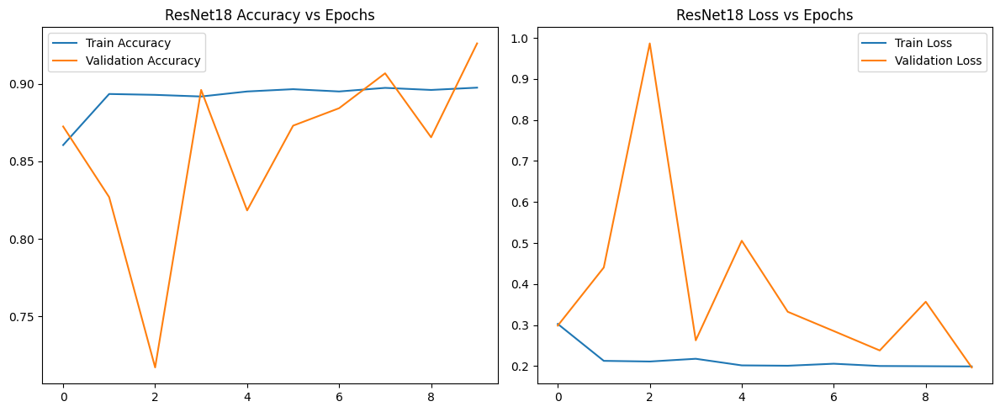


📍 Epoch 1/10


Training Phase: 100%|██████████| 445/445 [11:53<00:00,  1.60s/it]


Train Loss: 0.2381 | Acc: 0.8873


Validation Phase: 100%|██████████| 59/59 [00:29<00:00,  2.01it/s]


Validation Loss: 0.0760 | Acc: 0.9716

📍 Epoch 2/10


Training Phase: 100%|██████████| 445/445 [11:53<00:00,  1.60s/it]


Train Loss: 0.2123 | Acc: 0.8914


Validation Phase: 100%|██████████| 59/59 [00:29<00:00,  2.02it/s]


Validation Loss: 0.4208 | Acc: 0.8736

📍 Epoch 3/10


Training Phase: 100%|██████████| 445/445 [11:48<00:00,  1.59s/it]


Train Loss: 0.2129 | Acc: 0.8899


Validation Phase: 100%|██████████| 59/59 [00:29<00:00,  2.03it/s]


Validation Loss: 0.2214 | Acc: 0.9293

📍 Epoch 4/10


Training Phase: 100%|██████████| 445/445 [11:48<00:00,  1.59s/it]


Train Loss: 0.2092 | Acc: 0.8924


Validation Phase: 100%|██████████| 59/59 [00:29<00:00,  2.02it/s]


Validation Loss: 0.7443 | Acc: 0.8131

📍 Epoch 5/10


Training Phase: 100%|██████████| 445/445 [11:49<00:00,  1.59s/it]


Train Loss: 0.2135 | Acc: 0.8916


Validation Phase: 100%|██████████| 59/59 [00:29<00:00,  2.03it/s]


Validation Loss: 0.3193 | Acc: 0.9004

📍 Epoch 6/10


Training Phase: 100%|██████████| 445/445 [11:47<00:00,  1.59s/it]


Train Loss: 0.2044 | Acc: 0.8957


Validation Phase: 100%|██████████| 59/59 [00:28<00:00,  2.04it/s]


Validation Loss: 0.0697 | Acc: 0.9748

📍 Epoch 7/10


Training Phase: 100%|██████████| 445/445 [11:46<00:00,  1.59s/it]


Train Loss: 0.2013 | Acc: 0.8954


Validation Phase: 100%|██████████| 59/59 [00:28<00:00,  2.04it/s]


Validation Loss: 0.2475 | Acc: 0.9181

📍 Epoch 8/10


Training Phase: 100%|██████████| 445/445 [11:47<00:00,  1.59s/it]


Train Loss: 0.2036 | Acc: 0.8956


Validation Phase: 100%|██████████| 59/59 [00:29<00:00,  2.03it/s]


Validation Loss: 0.0445 | Acc: 0.9888

📍 Epoch 9/10


Training Phase: 100%|██████████| 445/445 [11:50<00:00,  1.60s/it]


Train Loss: 0.2026 | Acc: 0.8963


Validation Phase: 100%|██████████| 59/59 [00:29<00:00,  2.02it/s]


Validation Loss: 0.0219 | Acc: 0.9930

📍 Epoch 10/10


Training Phase: 100%|██████████| 445/445 [11:52<00:00,  1.60s/it]


Train Loss: 0.2010 | Acc: 0.8964


Validation Phase: 100%|██████████| 59/59 [00:28<00:00,  2.04it/s]


Validation Loss: 0.0201 | Acc: 0.9920

✅ Best FusionNet Validation Accuracy: 0.9930


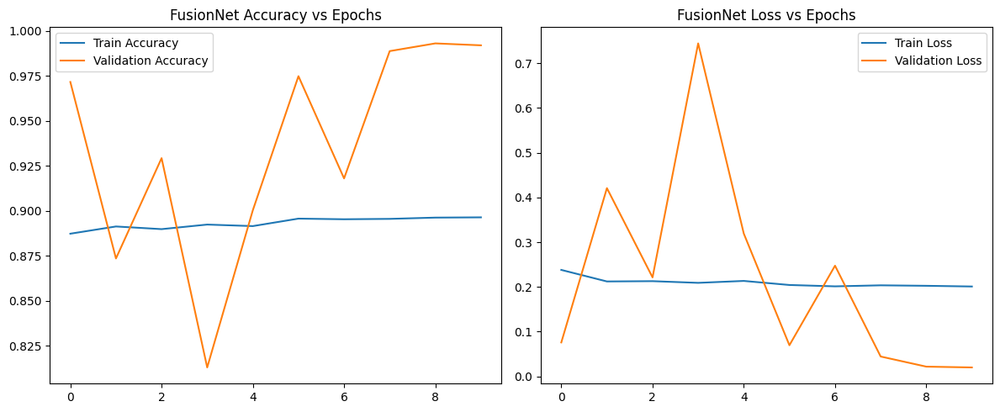

NameError: name 'accuracy_score' is not defined

In [29]:
# 1. Imports, device config, constants, etc.

# 2. Define EarlyStopping class

# 3. Define train_model() function ← You already have this

# 4. Define evaluate_model() function ← PLACE THIS HERE
def evaluate_model(model, dataloader, model_name="Model"):
    model.eval()
    all_preds, all_labels = [], []
    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    cr = classification_report(all_labels, all_preds, target_names=CLASSES)
    acc = accuracy_score(all_labels, all_preds)

    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=CLASSES, yticklabels=CLASSES)
    plt.xlabel('Predicted')
    plt.ylabel('True')
    plt.title(f'{model_name} Confusion Matrix')
    plt.show()

    print(f"✅ Classification Report for {model_name}:\n{cr}")
    print(f"✅ Test Accuracy: {acc:.4f}")

# 5. Define get_resnet(), get_vit(), get_fusion() functions

# 6. Prepare dataloaders: train_loader, val_loader, test_loader

# 7. Initialize models
resnet_model = get_resnet()
vit_model = get_vit()
fusion_model = get_fusion(resnet_model, vit_model)

# 8. Train models
resnet_model = train_model(resnet_model, "ResNet18", train_loader, val_loader, num_epochs=10)
fusion_model = train_model(fusion_model, "FusionNet", train_loader, val_loader, num_epochs=10)

# 9. Evaluate models ← You can now safely call it
evaluate_model(resnet_model, test_loader)
evaluate_model(fusion_model, test_loader)



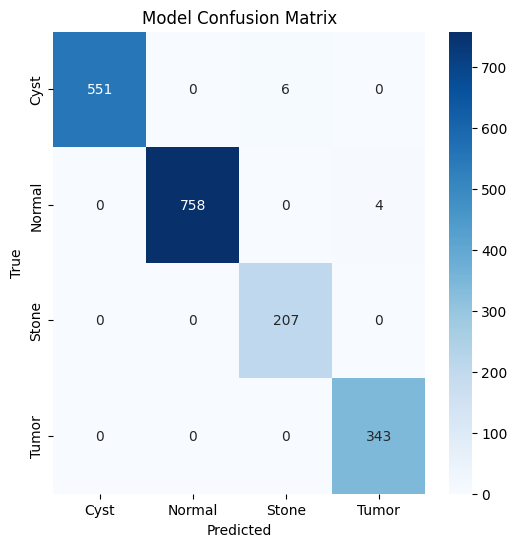

✅ Classification Report for Model:
              precision    recall  f1-score   support

        Cyst       1.00      0.99      0.99       557
      Normal       1.00      0.99      1.00       762
       Stone       0.97      1.00      0.99       207
       Tumor       0.99      1.00      0.99       343

    accuracy                           0.99      1869
   macro avg       0.99      1.00      0.99      1869
weighted avg       0.99      0.99      0.99      1869

✅ Test Accuracy: 0.9946


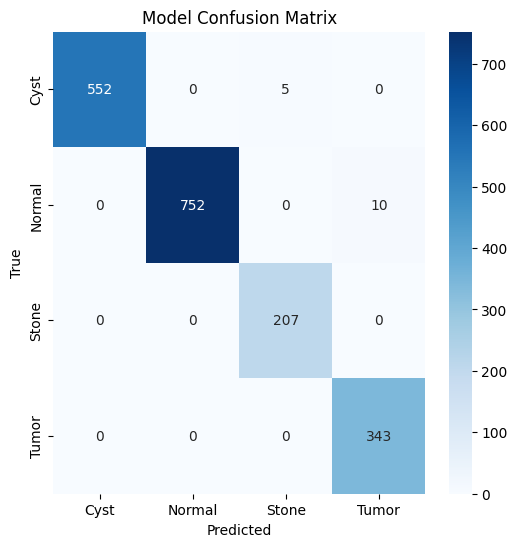

✅ Classification Report for Model:
              precision    recall  f1-score   support

        Cyst       1.00      0.99      1.00       557
      Normal       1.00      0.99      0.99       762
       Stone       0.98      1.00      0.99       207
       Tumor       0.97      1.00      0.99       343

    accuracy                           0.99      1869
   macro avg       0.99      0.99      0.99      1869
weighted avg       0.99      0.99      0.99      1869

✅ Test Accuracy: 0.9920


In [31]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
import seaborn as sns
# 9. Evaluate models ← You can now safely call it
evaluate_model(resnet_model, test_loader)
evaluate_model(fusion_model, test_loader)

In [32]:
import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score

# Update this with your actual class names
CLASSES = ["Cyst", "Normal", "Stone", "Tumor"]


def evaluate_model(model, dataloader, model_name="Model"):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    # Accuracy
    overall_acc = accuracy_score(all_labels, all_preds)
    print(f"\n📊 Overall Accuracy for {model_name}: {overall_acc:.4f}")

    # Classification Report
    print(f"\n🧾 Classification Report for {model_name}:\n")
    print(classification_report(all_labels, all_preds, target_names=CLASSES, digits=4))

    # Confusion Matrix
    cm = confusion_matrix(all_labels, all_preds)
    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=CLASSES, yticklabels=CLASSES)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix - {model_name}')
    plt.tight_layout()
    plt.show()


📊 Overall Accuracy for ResNet18: 0.9946

🧾 Classification Report for ResNet18:

              precision    recall  f1-score   support

        Cyst     1.0000    0.9892    0.9946       557
      Normal     1.0000    0.9948    0.9974       762
       Stone     0.9718    1.0000    0.9857       207
       Tumor     0.9885    1.0000    0.9942       343

    accuracy                         0.9946      1869
   macro avg     0.9901    0.9960    0.9930      1869
weighted avg     0.9948    0.9946    0.9947      1869



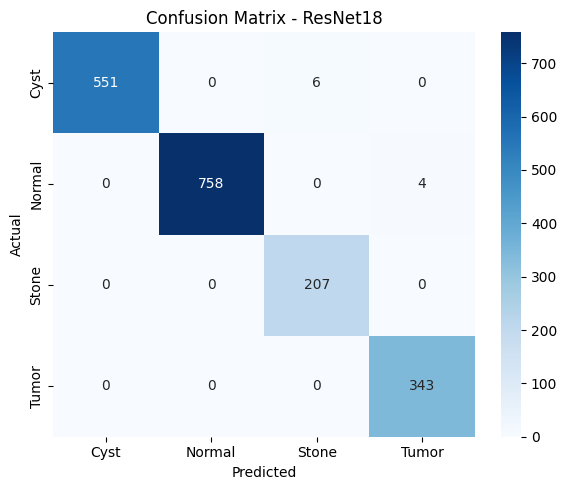


📊 Overall Accuracy for FusionNet: 0.9920

🧾 Classification Report for FusionNet:

              precision    recall  f1-score   support

        Cyst     1.0000    0.9910    0.9955       557
      Normal     1.0000    0.9869    0.9934       762
       Stone     0.9764    1.0000    0.9881       207
       Tumor     0.9717    1.0000    0.9856       343

    accuracy                         0.9920      1869
   macro avg     0.9870    0.9945    0.9906      1869
weighted avg     0.9922    0.9920    0.9920      1869



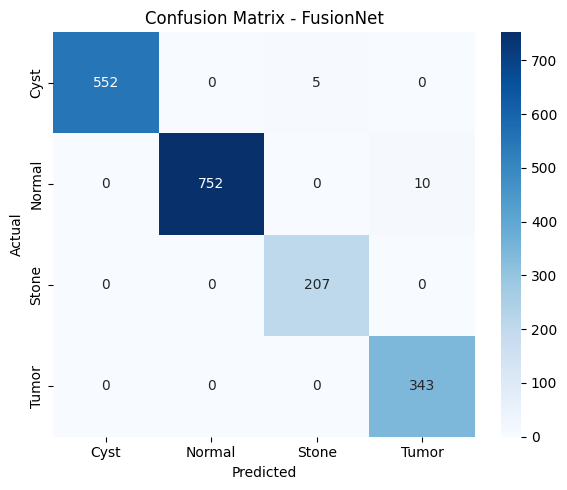

In [33]:
evaluate_model(resnet_model, test_loader, model_name="ResNet18")
evaluate_model(fusion_model, test_loader, model_name="FusionNet")

  0%|          | 0/1000 [00:00<?, ?it/s]

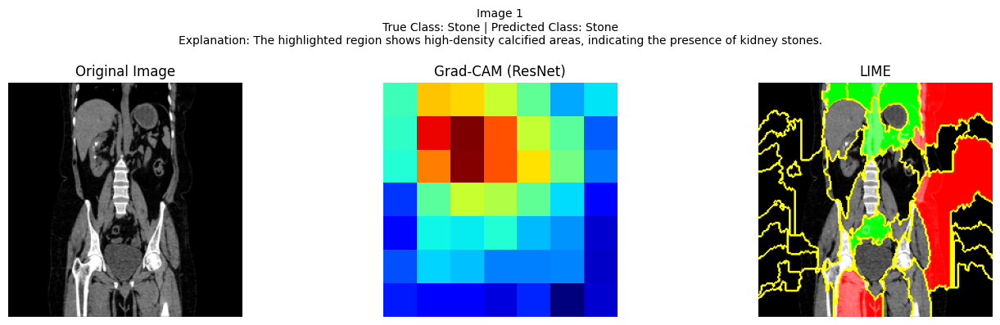

Image 1
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

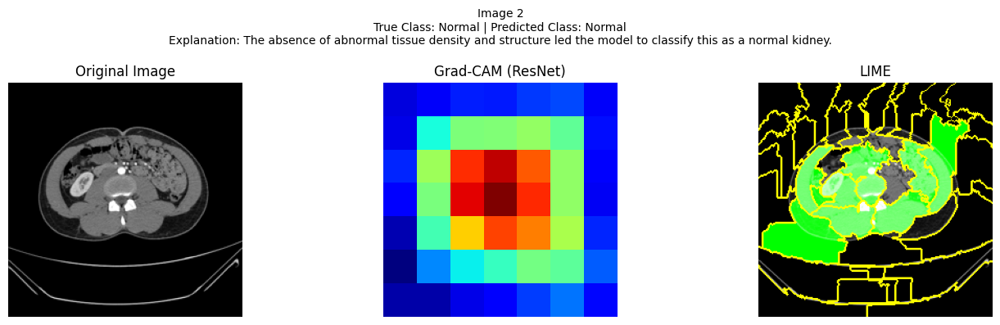

Image 2
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

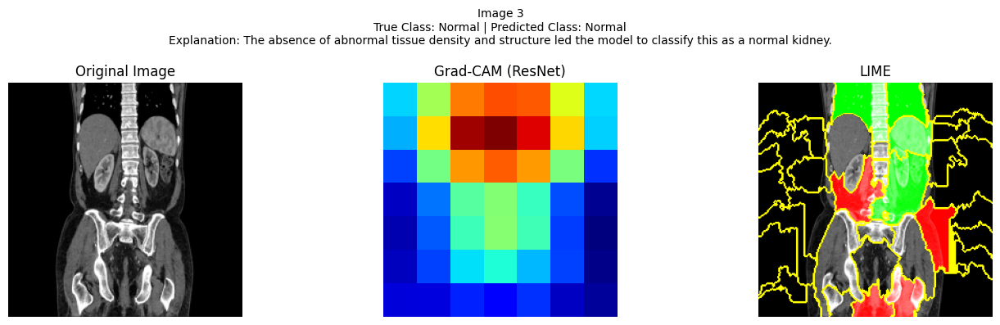

Image 3
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

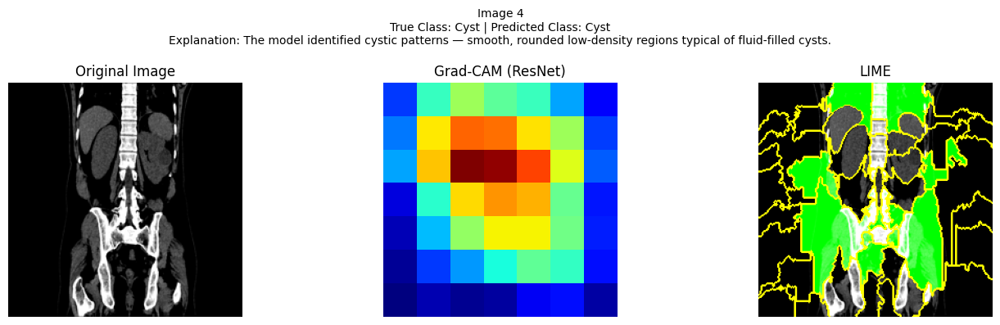

Image 4
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

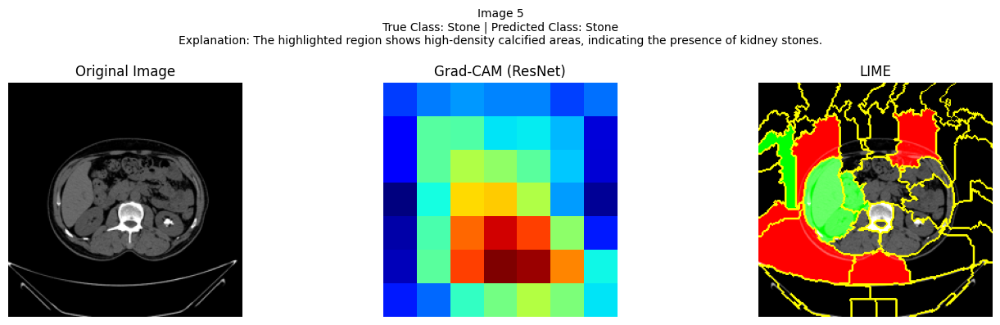

Image 5
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

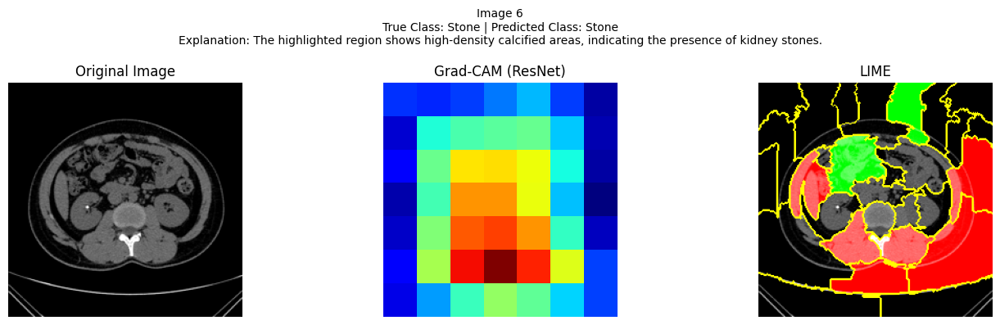

Image 6
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

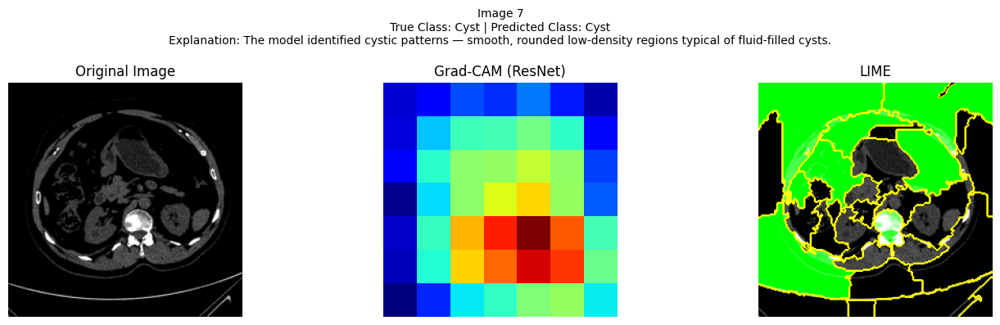

Image 7
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

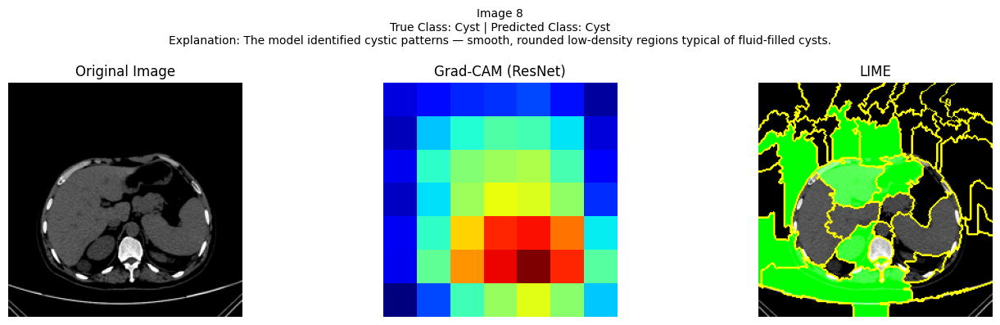

Image 8
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

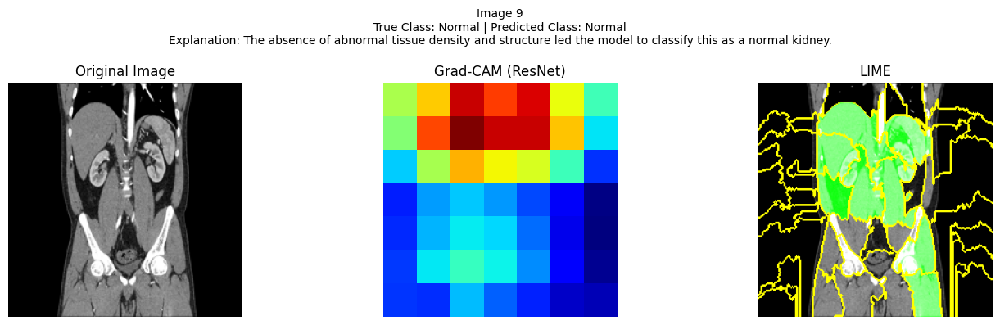

Image 9
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

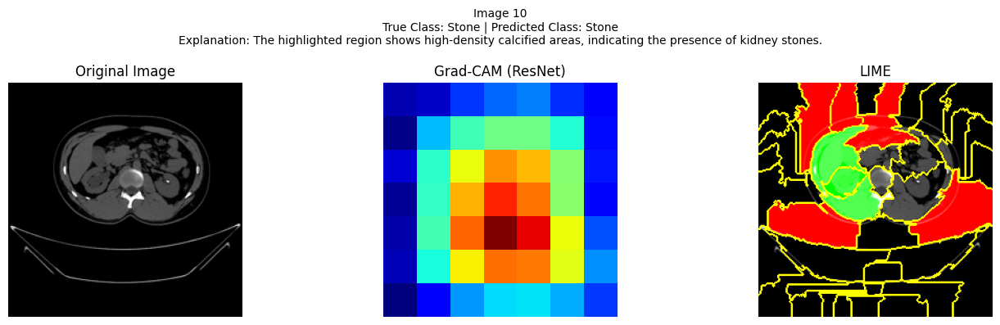

Image 10
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

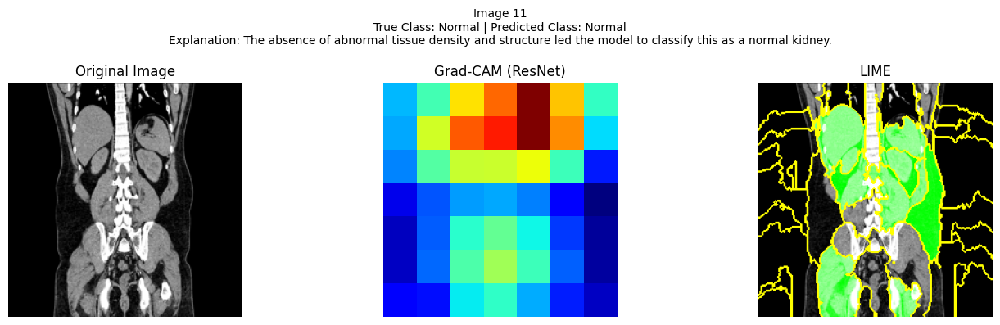

Image 11
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

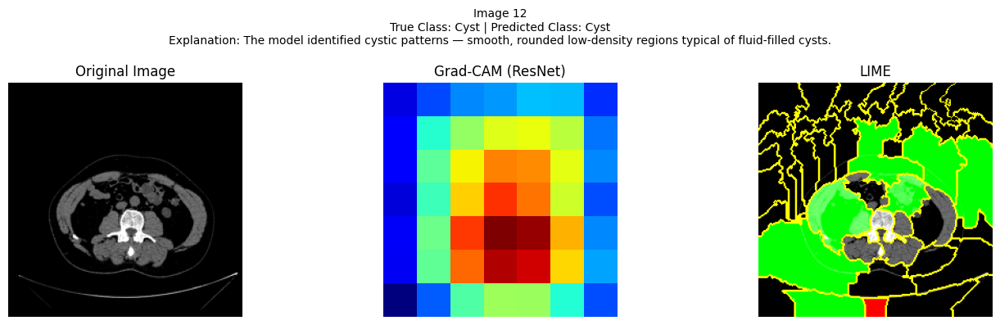

Image 12
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

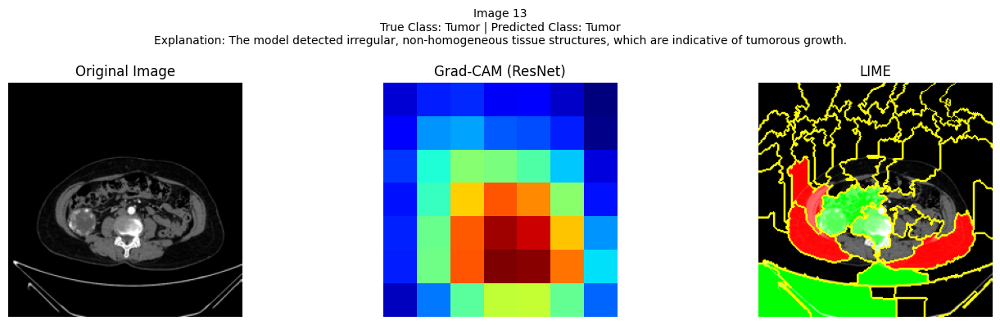

Image 13
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

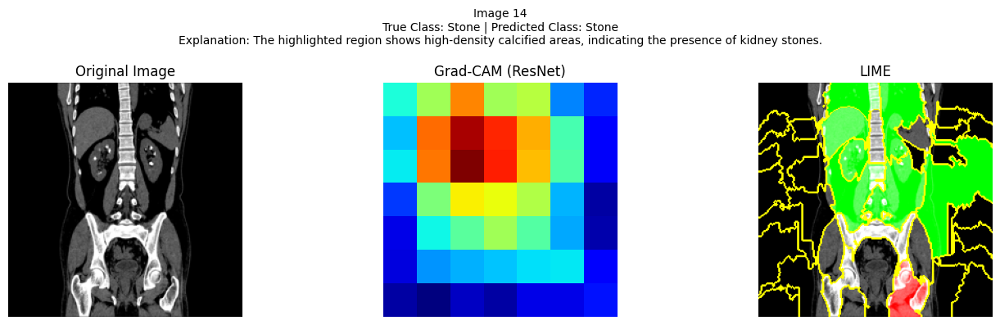

Image 14
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

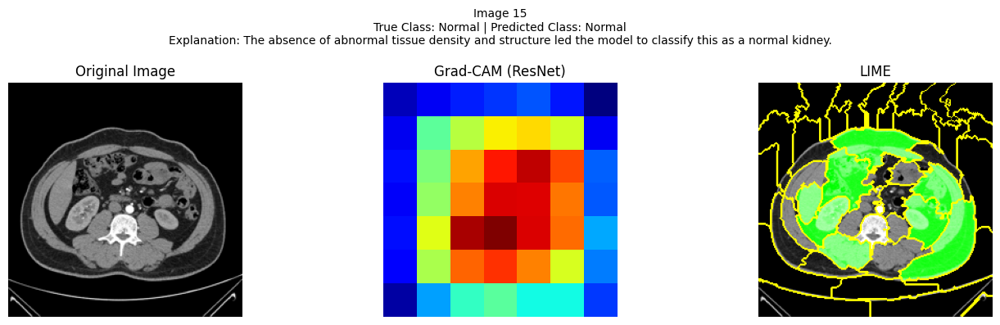

Image 15
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

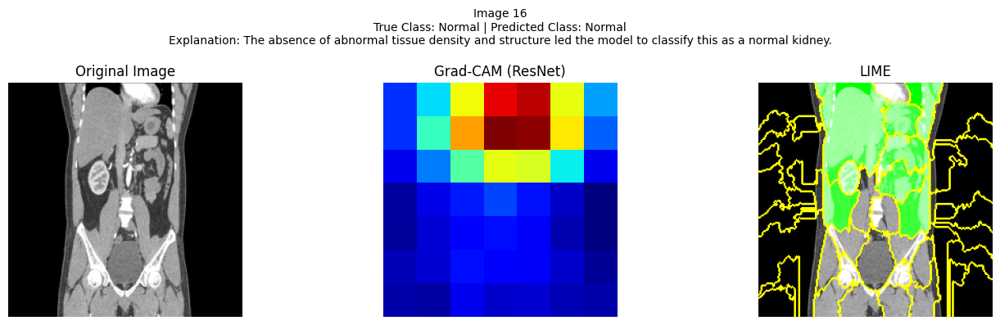

Image 16
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

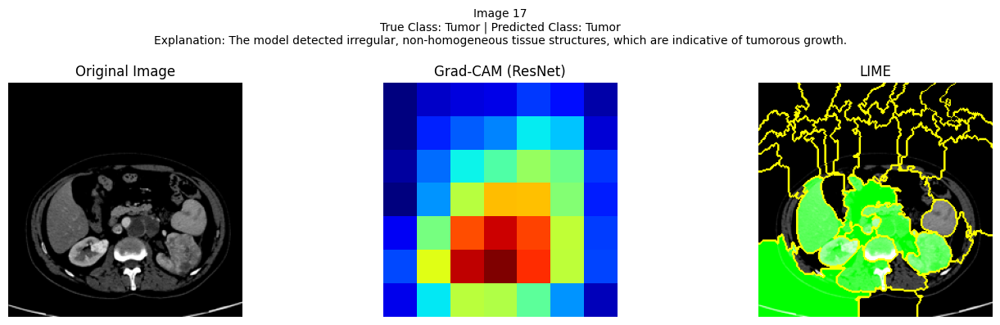

Image 17
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

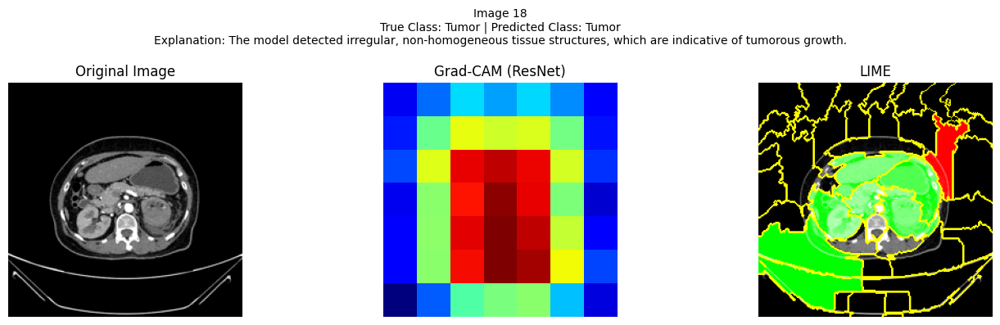

Image 18
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

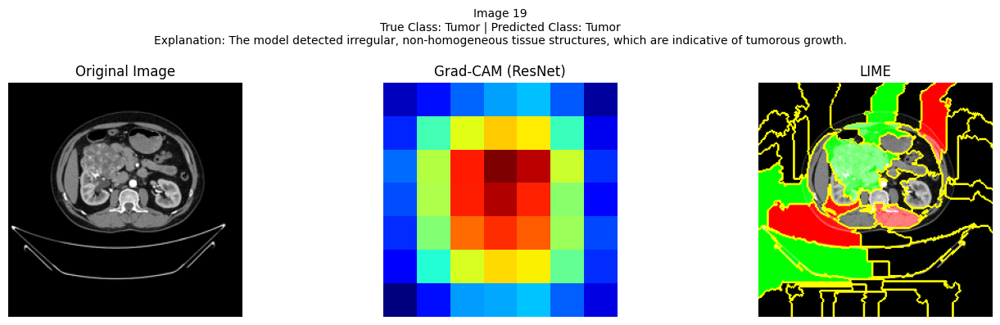

Image 19
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

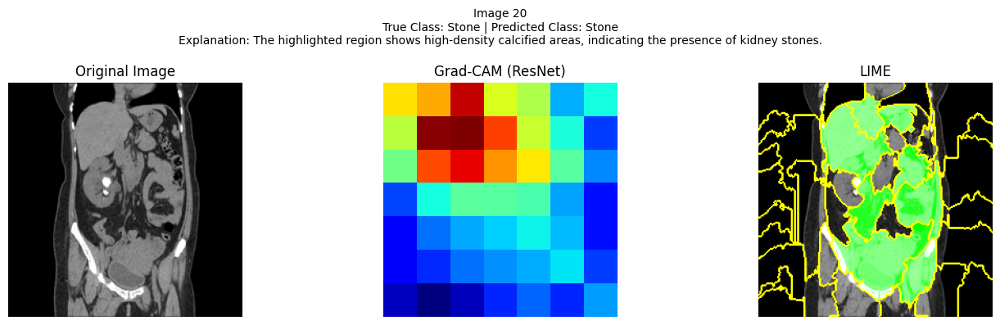

Image 20
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

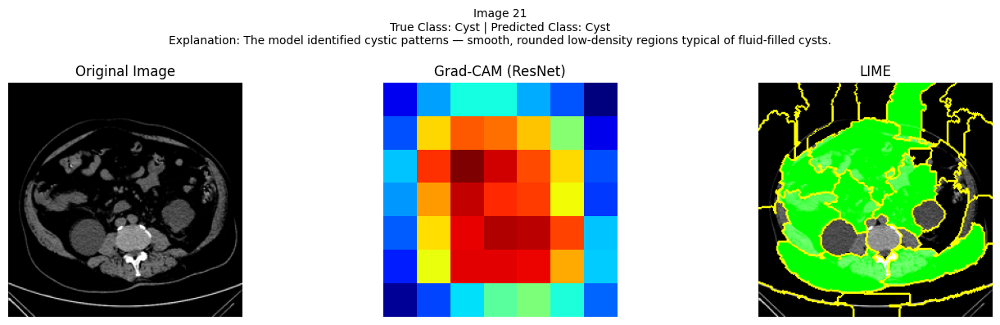

Image 21
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

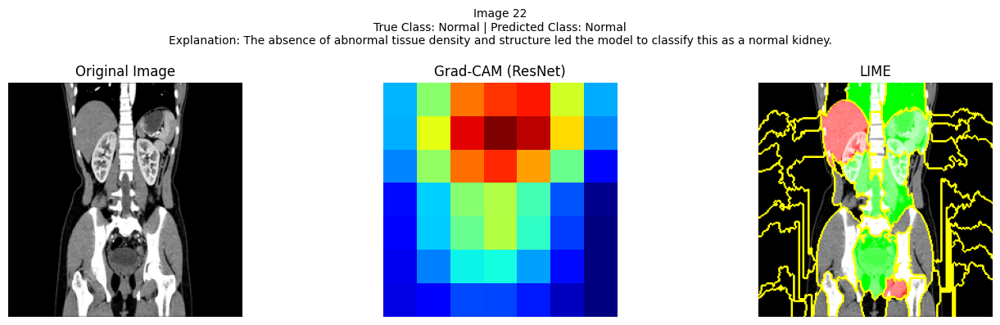

Image 22
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

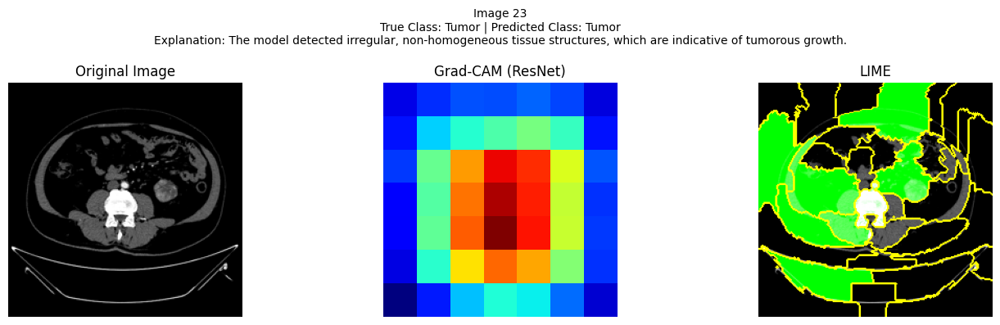

Image 23
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

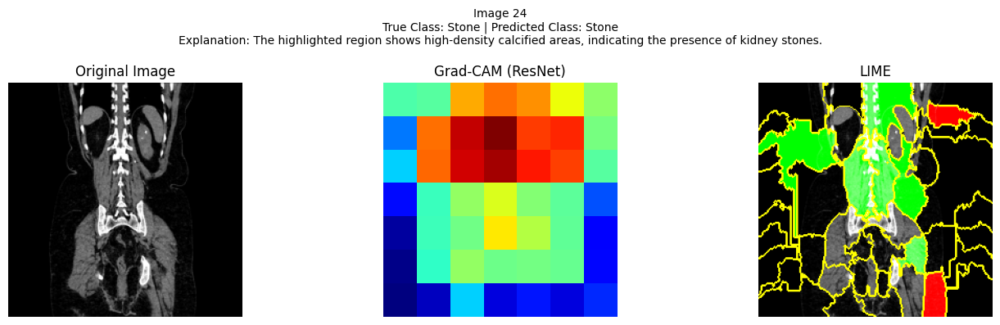

Image 24
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

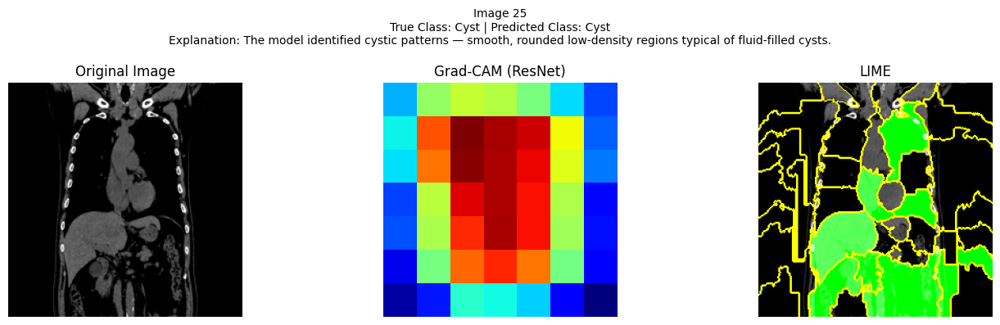

Image 25
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

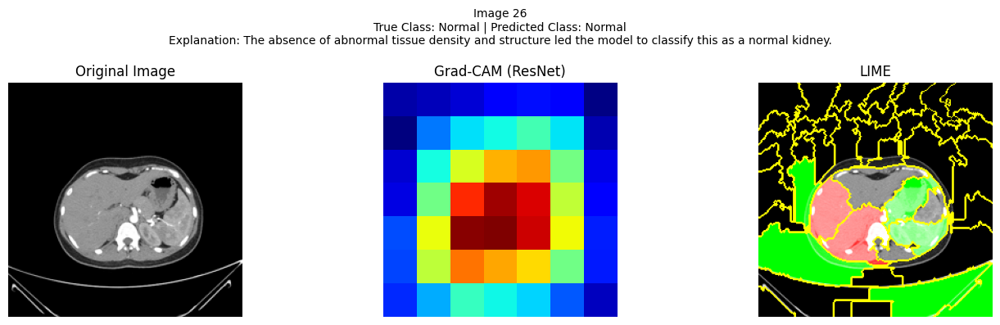

Image 26
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

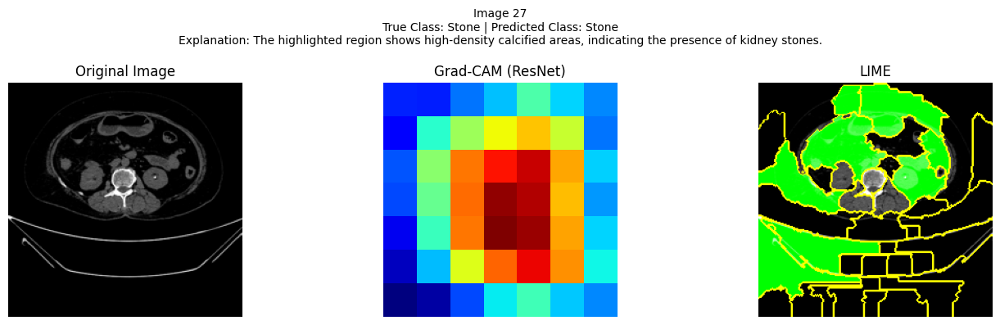

Image 27
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

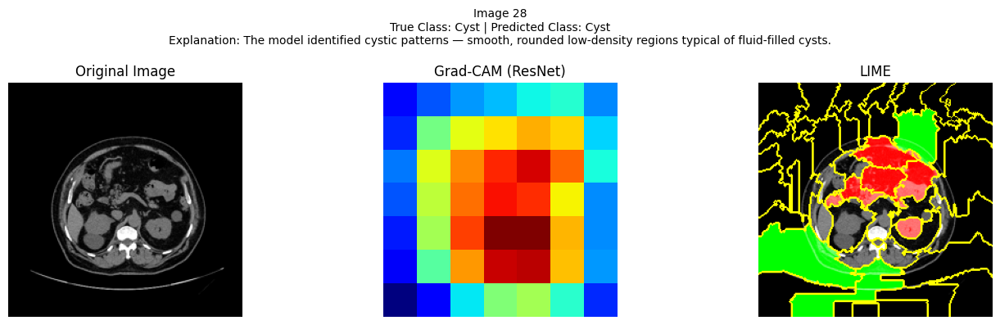

Image 28
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

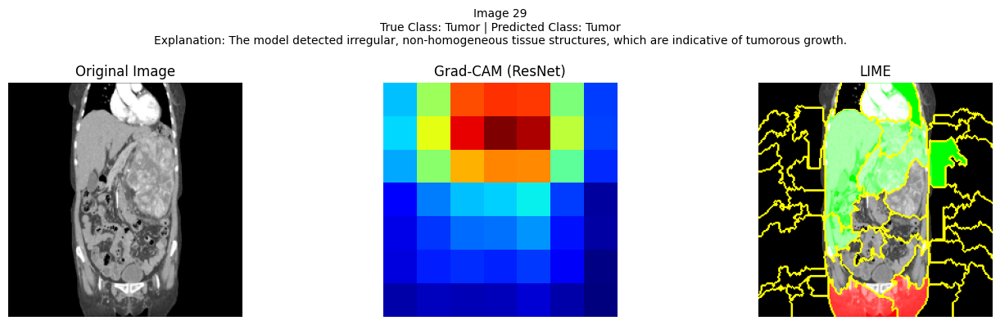

Image 29
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

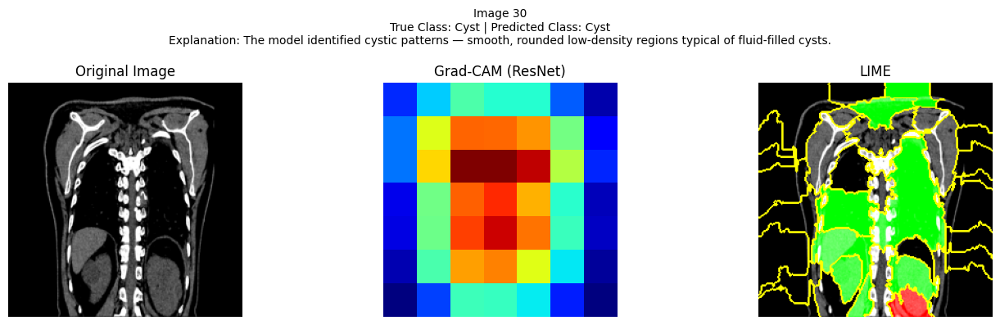

Image 30
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

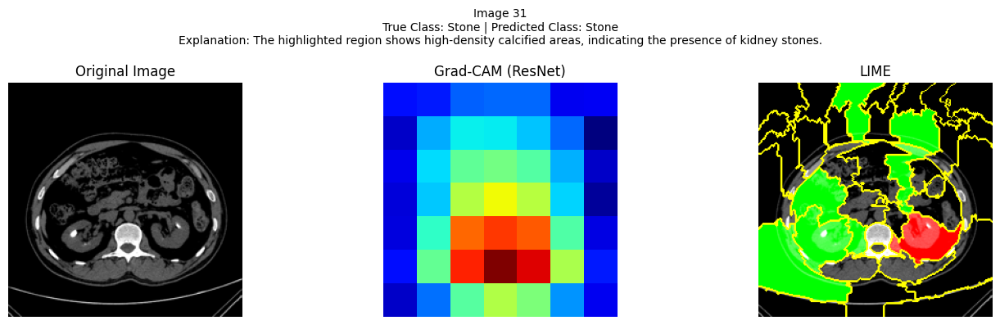

Image 31
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

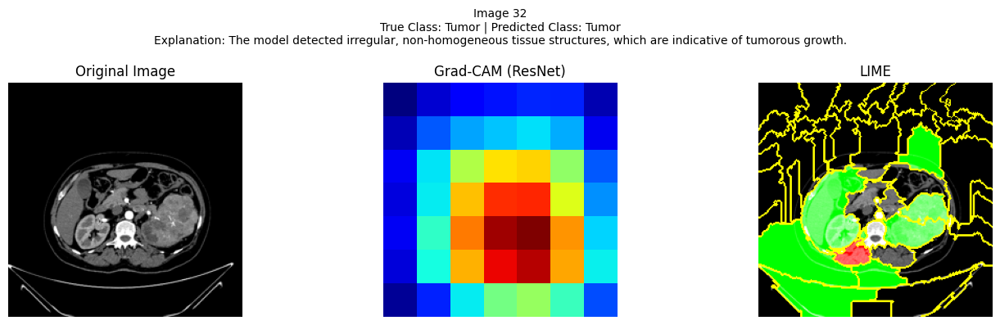

Image 32
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

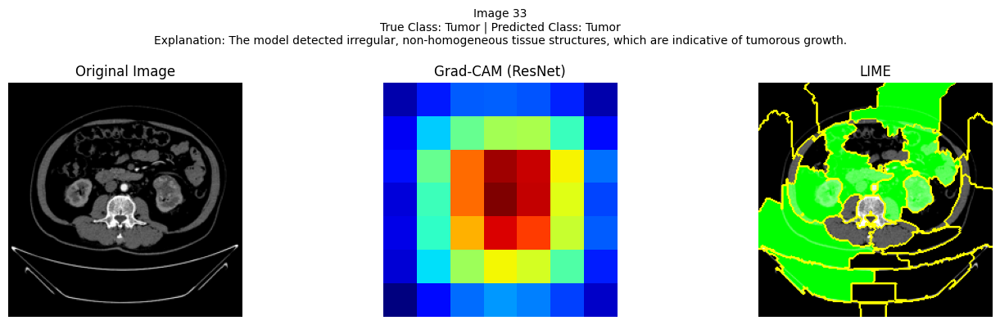

Image 33
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

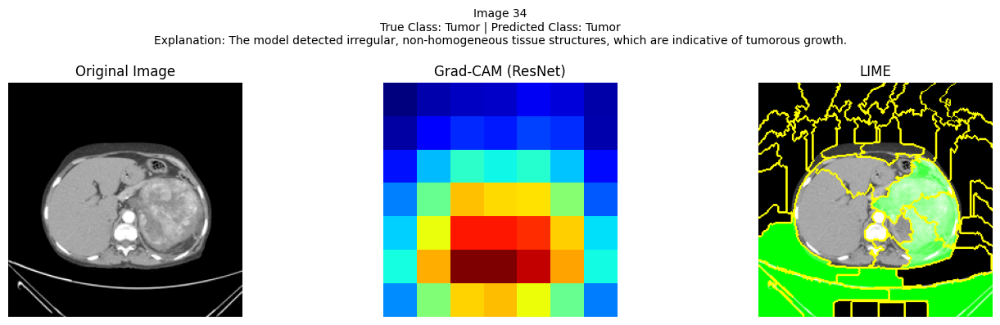

Image 34
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

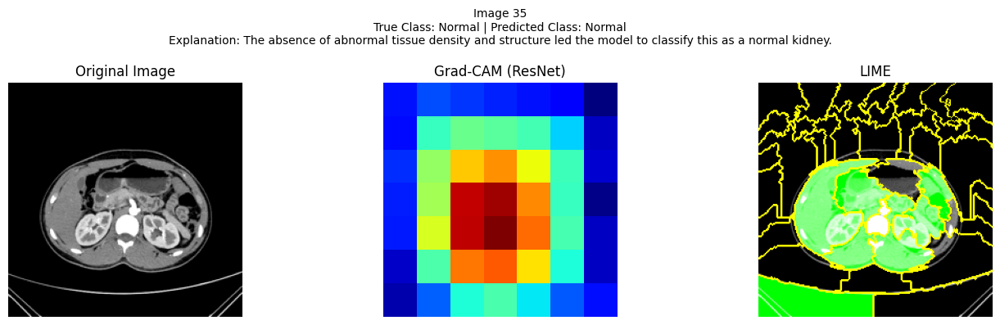

Image 35
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

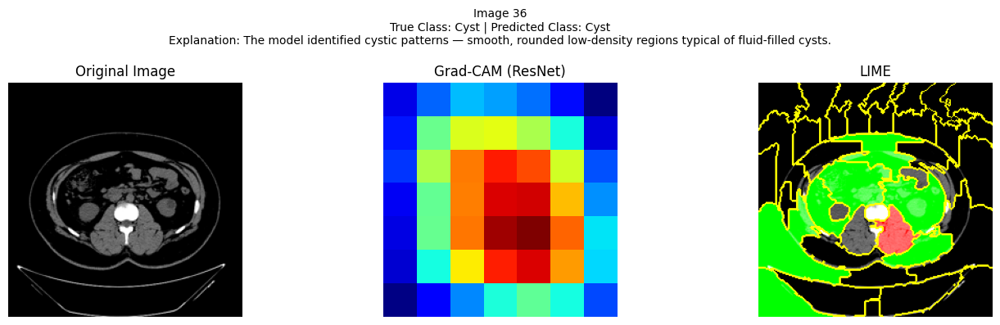

Image 36
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

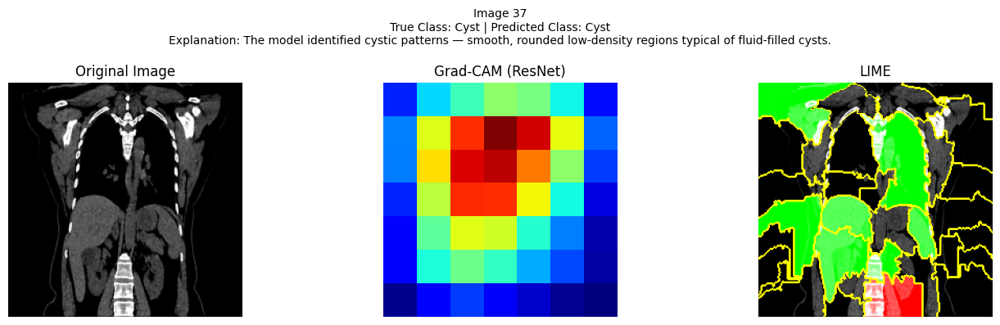

Image 37
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

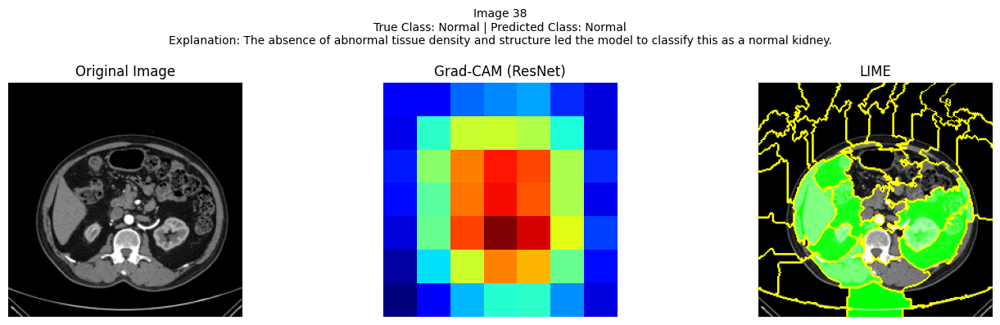

Image 38
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

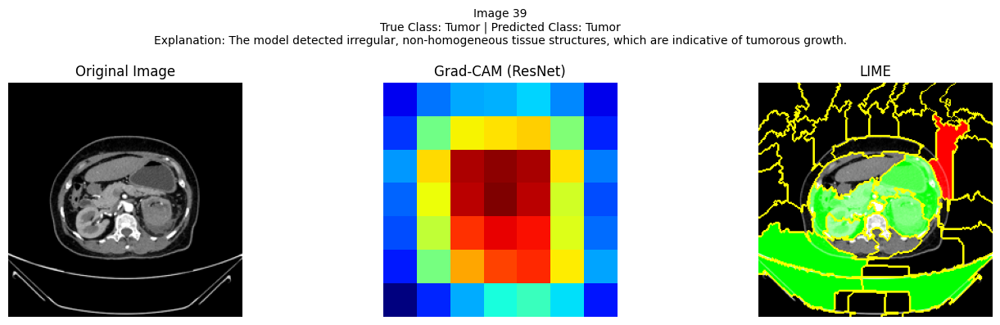

Image 39
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

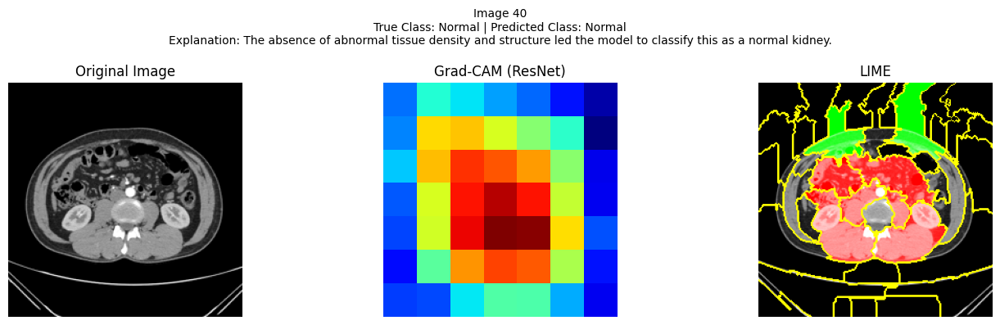

Image 40
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

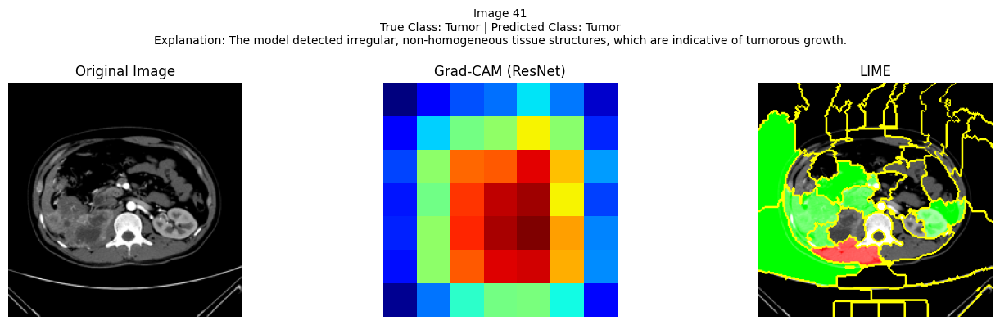

Image 41
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

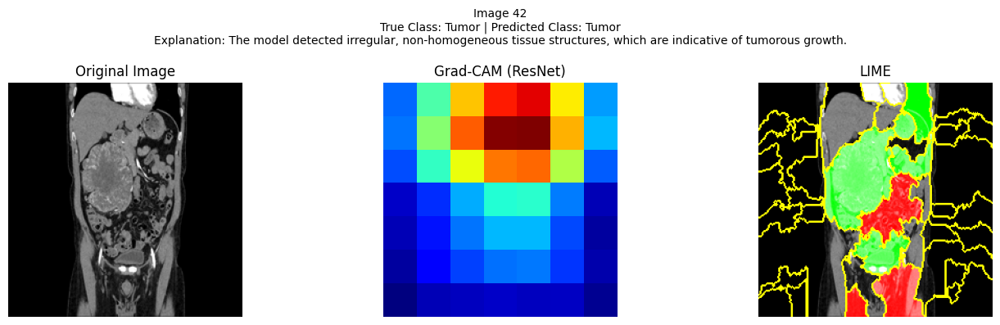

Image 42
True Class: Tumor | Predicted Class: Tumor
Explanation: The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

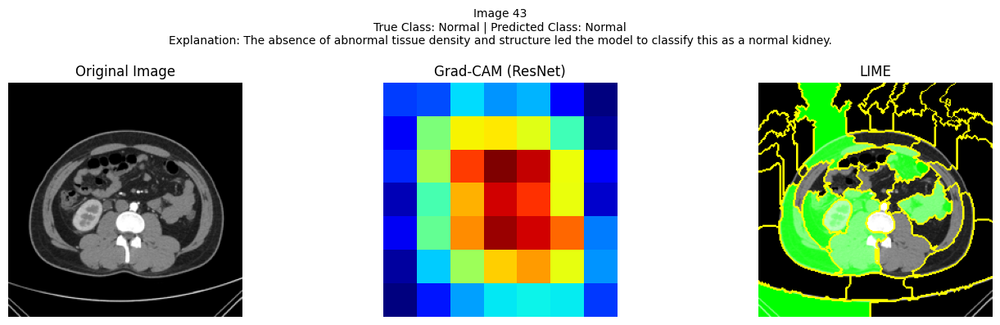

Image 43
True Class: Normal | Predicted Class: Normal
Explanation: The absence of abnormal tissue density and structure led the model to classify this as a normal kidney.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

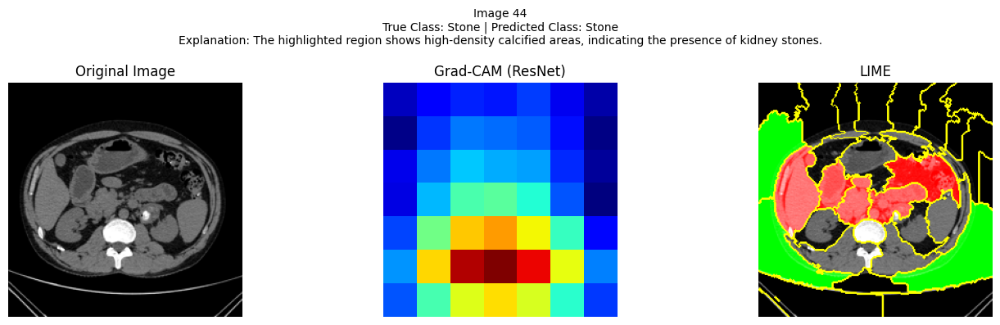

Image 44
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

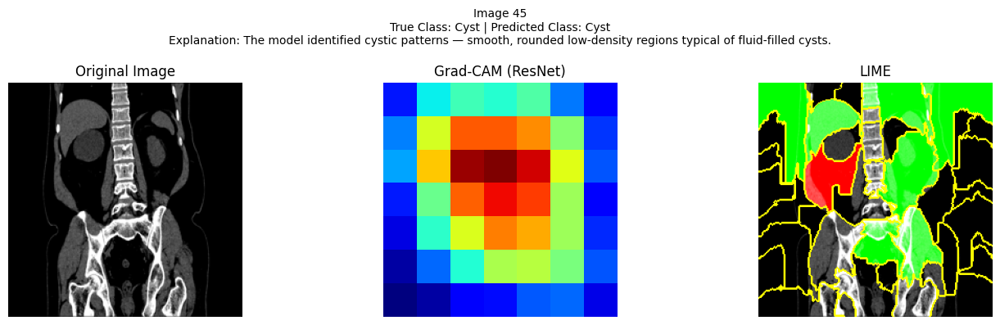

Image 45
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

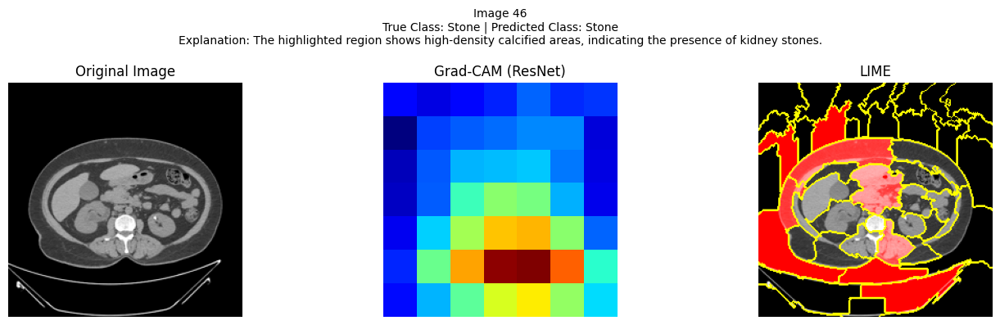

Image 46
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

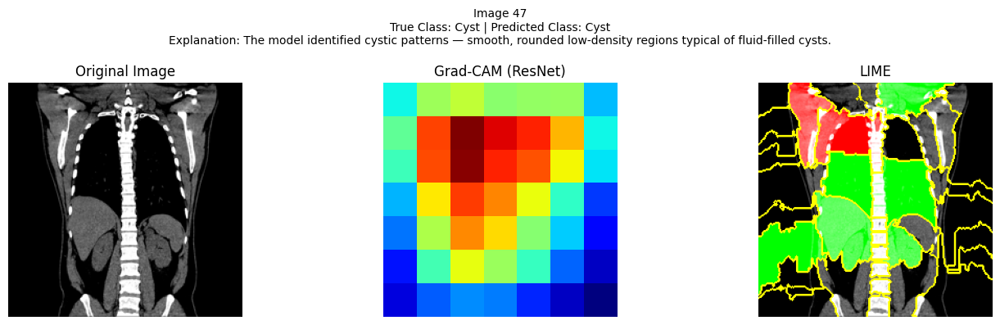

Image 47
True Class: Cyst | Predicted Class: Cyst
Explanation: The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts.
----------------------------------------------------------------------------------------------------


  0%|          | 0/1000 [00:00<?, ?it/s]

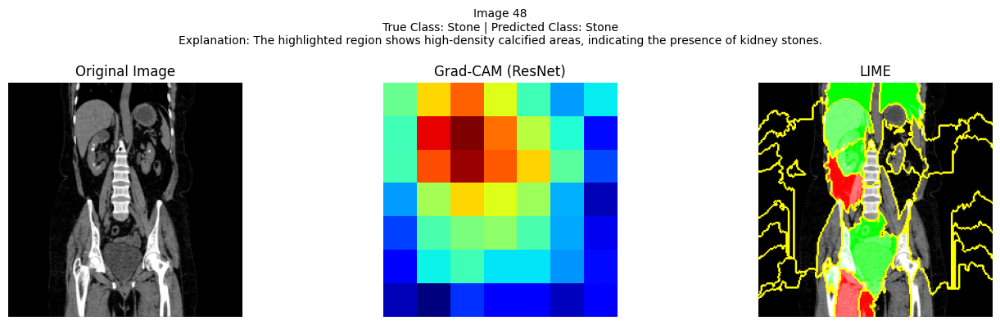

Image 48
True Class: Stone | Predicted Class: Stone
Explanation: The highlighted region shows high-density calcified areas, indicating the presence of kidney stones.
----------------------------------------------------------------------------------------------------


In [35]:
import os
import random
import torch
import matplotlib.pyplot as plt
import numpy as np
from torchvision import transforms
from PIL import Image
from torchcam.methods import SmoothGradCAMpp
from lime import lime_image
from skimage.segmentation import mark_boundaries

# --- Setup ---
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
test_root = "processed_kidney_dataset/test"
classes = sorted(os.listdir(test_root))

transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# --- Select 50 Balanced Random Test Images ---
selected_images = []
images_per_class = 50 // len(classes)

for cls in classes:
    cls_dir = os.path.join(test_root, cls)
    cls_images = [os.path.join(cls_dir, img) for img in os.listdir(cls_dir) if os.path.isfile(os.path.join(cls_dir, img))]
    sampled = random.sample(cls_images, min(images_per_class, len(cls_images)))
    for img_path in sampled:
        selected_images.append((img_path, cls))

random.shuffle(selected_images)

# --- Grad-CAM (ResNet model) ---
resnet_cam = SmoothGradCAMpp(resnet_model, target_layer="layer4")

# --- LIME Setup (Fusion model) ---
explainer = lime_image.LimeImageExplainer()

save_dir = "fusion_interpretability_outputs"
os.makedirs(save_dir, exist_ok=True)

# --- Explanation Helper ---
def generate_explanation(class_idx, class_name):
    if class_name == "Cyst":
        return "The model identified cystic patterns — smooth, rounded low-density regions typical of fluid-filled cysts."
    elif class_name == "Stone":
        return "The highlighted region shows high-density calcified areas, indicating the presence of kidney stones."
    elif class_name == "Tumor":
        return "The model detected irregular, non-homogeneous tissue structures, which are indicative of tumorous growth."
    elif class_name == "Normal":
        return "The absence of abnormal tissue density and structure led the model to classify this as a normal kidney."
    else:
        return "The model based its decision on spatial and texture cues matching this class pattern."

# --- LIME prediction wrapper ---
def batch_predict(images):
    images = torch.stack([transform(Image.fromarray((img * 255).astype(np.uint8)).convert("L")) for img in images], dim=0).to(device)
    outputs = fusion_model(images)
    return outputs.detach().cpu().numpy()

# --- Process and Visualize ---
for idx, (img_path, true_label) in enumerate(selected_images, 1):
    # Load image
    img = Image.open(img_path).convert("L")
    img_tensor = transform(img).unsqueeze(0).to(device)

    # Get prediction from Fusion model
    output = fusion_model(img_tensor)
    pred_idx = output.argmax(dim=1).item()
    pred_class = classes[pred_idx]

    # --- Grad-CAM from ResNet ---
    _ = resnet_model(img_tensor)  # forward pass
    cam_map = resnet_cam(pred_idx)[0].squeeze().cpu().numpy()

    # --- LIME from Fusion model ---
    img_np = np.array(img.resize((224, 224)).convert("RGB"))
    explanation = explainer.explain_instance(img_np, batch_predict, top_labels=1, hide_color=0, num_samples=1000)
    top_label = explanation.top_labels[0]
    lime_img, _ = explanation.get_image_and_mask(top_label, positive_only=False, num_features=8, hide_rest=False)

    # --- Visualization ---
    fig, axs = plt.subplots(1, 3, figsize=(14, 4))
    axs[0].imshow(img_np, cmap="gray")
    axs[0].set_title("Original Image")
    axs[1].imshow(cam_map, cmap='jet')
    axs[1].set_title("Grad-CAM (ResNet)")
    axs[2].imshow(mark_boundaries(lime_img, explanation.segments))
    axs[2].set_title("LIME")

    for ax in axs:
        ax.axis('off')

    # --- Generate Explanation and Title ---
    paragraph = generate_explanation(pred_idx, pred_class)
    full_text = f"Image {idx}\nTrue Class: {true_label} | Predicted Class: {pred_class}\nExplanation: {paragraph}"

    plt.suptitle(full_text, fontsize=10)
    plt.tight_layout()
    plt.savefig(f"{save_dir}/img_{idx}_explanation.png")
    plt.show()

    print(full_text)
    print("-" * 100)


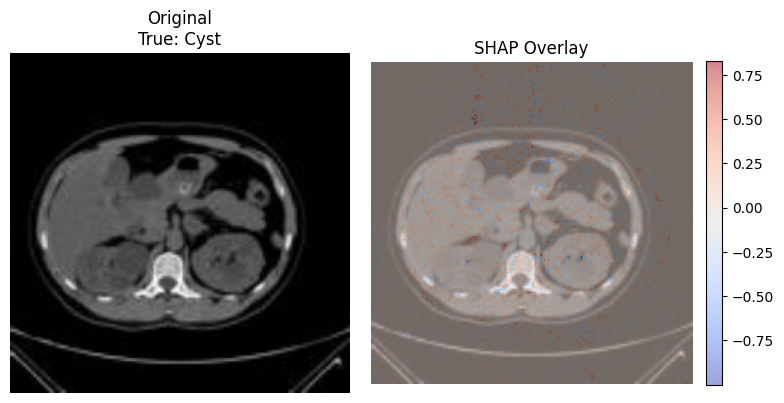

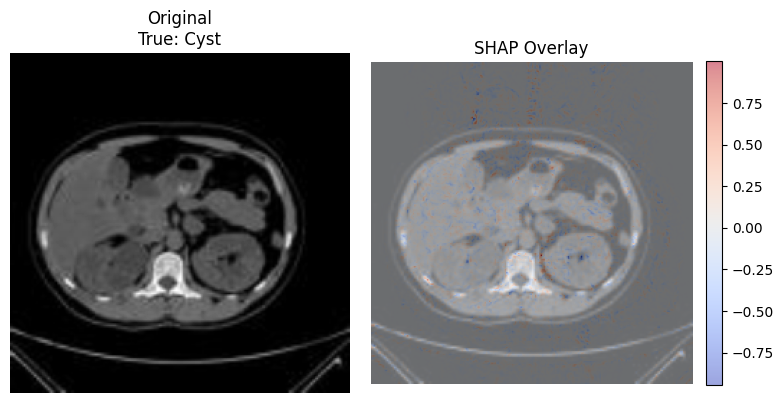

In [55]:
import torch
import torch.nn as nn
import torchvision.transforms as transforms
from torchvision.models import resnet18, ResNet18_Weights, vit_b_16, ViT_B_16_Weights
from torchvision.datasets import ImageFolder
from torch.utils.data import DataLoader
import shap
import matplotlib.pyplot as plt
import numpy as np

# ✅ Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ✅ Transforms
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=3),
    transforms.Resize((224, 224)),
    transforms.ToTensor()
])

# ✅ Dataset & Loader
test_path = "/kaggle/working/balanced_kidney_dataset/test"
dataset = ImageFolder(test_path, transform=transform)
dataloader = DataLoader(dataset, batch_size=1, shuffle=False)
class_names = dataset.classes  # For label names

# ✅ Fusion Model
class FusionModel(nn.Module):
    def __init__(self):
        super(FusionModel, self).__init__()
        resnet = resnet18(weights=ResNet18_Weights.DEFAULT)
        self.resnet_features = nn.Sequential(*list(resnet.children())[:-1])
        self.resnet_fc = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, 256),
            nn.ReLU()
        )

        self.vit = vit_b_16(weights=ViT_B_16_Weights.DEFAULT)
        self.vit_fc = nn.Sequential(
            nn.Linear(768, 256),
            nn.ReLU()
        )
        self.vit_feature = None
        self.vit.encoder.layers[-1].register_forward_hook(self._hook_vit)

        self.classifier = nn.Linear(512, 2)

    def _hook_vit(self, module, input, output):
        self.vit_feature = output[:, 0, :]

    def forward(self, x):
        if x.shape[1] == 1:
            x = x.repeat(1, 3, 1, 1)
        r = self.resnet_features(x)
        r = self.resnet_fc(r)
        _ = self.vit(x)
        v = self.vit_fc(self.vit_feature)
        combined = torch.cat((r, v), dim=1)
        return self.classifier(combined)

# ✅ Wrap model
class WrappedModel(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model

    def forward(self, x):
        if x.shape[1] == 1:
            x = x.repeat(1, 3, 1, 1)
        return self.model(x)

# ✅ Init model
model = FusionModel().to(device)
model.eval()
wrapped_model = WrappedModel(model).to(device)

# ✅ SHAP input
background_tensor = torch.stack([dataset[i][0] for i in range(10)]).to(device)
test_tensor = torch.stack([dataset[i][0] for i in range(10, 12)]).to(device)
true_labels = [dataset[i][1] for i in range(10, 12)]

# ✅ SHAP explainer
explainer = shap.GradientExplainer(wrapped_model, background_tensor)
shap_values, _ = explainer.shap_values(test_tensor)  # Returns: list of [B, C, H, W] or [B, C*H*W]
def plot_shap_overlay_side_by_side(shap_values, images, labels, num_samples=2, cmap='coolwarm', alpha=0.5):
    shap_np = shap_values[0]  # class 0 SHAP values
    img_np = images.detach().cpu().numpy()

    for i in range(num_samples):
        shap_val = shap_np[i]

        # ✅ Handle different SHAP shapes
        if shap_val.ndim == 1:
            if shap_val.shape[0] == 224 * 224:
                shap_val = shap_val.reshape(1, 224, 224)
            elif shap_val.shape[0] == 3 * 224 * 224:
                shap_val = shap_val.reshape(3, 224, 224)
        elif shap_val.ndim == 3 and shap_val.shape[0] in [1, 3]:
            pass  # already good
        elif shap_val.ndim == 2 and shap_val.shape == (224, 224):
            pass  # already perfect
        else:
            print(f"❌ SHAP still has shape {shap_val.shape} — expected (3, 224, 224) or (224, 224)")
            continue

        # ✅ Reduce to 2D if needed
        if shap_val.ndim == 3:
            shap_val = shap_val.mean(0)

        # ✅ Normalize for colormap
        shap_val /= np.abs(shap_val).max() + 1e-8

        # ✅ Grayscale input image
        img = img_np[i].mean(0)

        fig, axes = plt.subplots(1, 2, figsize=(8, 4))

        # Original
        axes[0].imshow(img, cmap='gray')
        axes[0].set_title(f"Original\nTrue: {class_names[labels[i]]}")
        axes[0].axis('off')

        # SHAP Overlay
        axes[1].imshow(img, cmap='gray')
        im = axes[1].imshow(shap_val, cmap=cmap, alpha=alpha)
        axes[1].set_title("SHAP Overlay")
        axes[1].axis('off')

        fig.colorbar(im, ax=axes[1], fraction=0.046, pad=0.04)
        plt.tight_layout()
        plt.show()



# ✅ Plot
plot_shap_overlay_side_by_side(shap_values, test_tensor, true_labels, num_samples=2)
